<a href="https://colab.research.google.com/github/tarantulass/control-theory/blob/main/TSS_Week1_ControlTheory.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***Welcome everyone to the most awaited Control Theory Bootcamp!!***

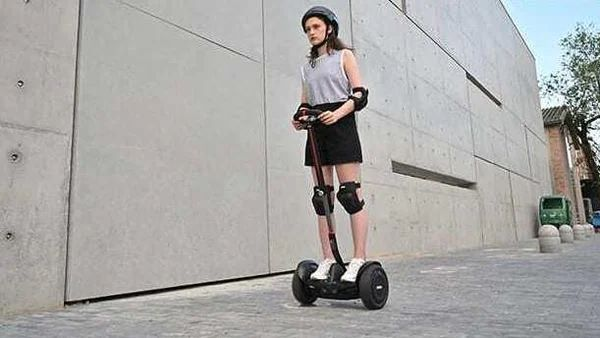

# Day 1

## Introduction

Have you ever tried balancing a pencil on the end of your finger? Maybe the first few times it falls off. But with some practice you can balance it like a pro. It definitely takes a good deal of muscle control to balance a pencil. Even the slightest vibration could tip it over.

This seemingly mundane example tells us several key ideas about control that extend to almost every engineering discipline. We seek to maintain the state of a particular system by controlling it while there are opposing factors that seek to destabilise the system. Many devices which seem to work like a charm require a good amount of control in the background for them to function properly. Control systems ensure that unpredictable disturbances or noise do not jeopardise their functioning while also maintaining optimal resource usage and stability.

If you don’t want your systems to go out of control, this is the place to understand the key ideas behind controlling!

Visit the [Control Theory wiki](https://en.wikipedia.org/wiki/Control_theory) for a more technical description of the field

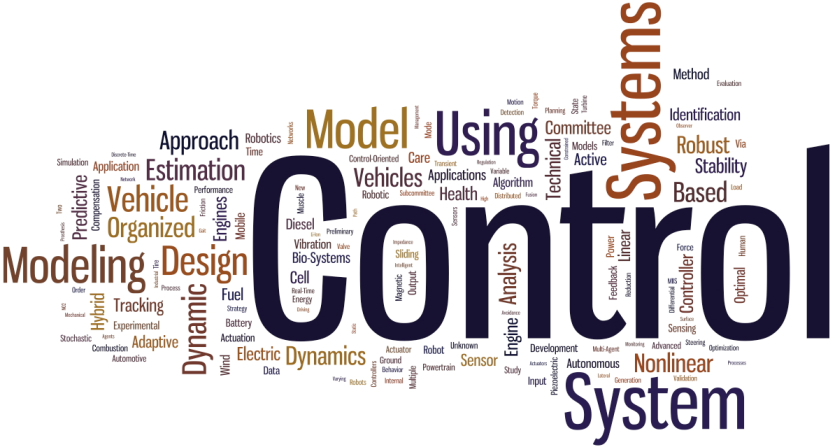

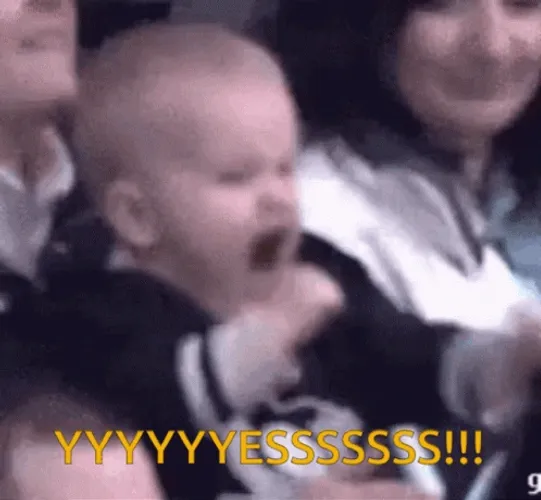

In [ ]:
#@title So we are ready to begin!! Are you??
from IPython.display import Image

Image(filename='/content/yesss.gif', width=400, height=400)




### Control systems - the basic definitions


- **Control system** - A collection of components that are collectively responsible for bringing the output of the system to the one desired by the input. (Note that a control system *contains* a controller, and is not the same thing)



- The **input** consists of instructions and measurements of parameters that dictate what the desired output should be.

- The **output** consists of a set of variables that describe the features of the system, collectively referred to as the state of the system. The state of a system is generally represented by $x$ .

  For example — In a car, the input could be the instructions to a driver while the output could be the position and velocity of a car.

A control system typically consists of the following components -

- **Plant** — The part of the control system that is being controlled. It consists of the actuator, which executes the control command, and the process which responds to the actuation and undergoes a time evolution. In many cases, the plant could be a dynamic system like a car or a pendulum.

- **Controller** — The part of the control system that provides control commands to the plant so that the state gets driven to the desired one. The control command is generally represented by $u$ .

- **Sensors** — The part of the control system that takes an observation/measurement of the state completely or partially. The sensor observation is generally represented by $y$ .

Looking at a car in more detail we might realise that the driver acts as a controller and the car as a plant. The speedometer serves as a sensor that guides the driver to press the accelerator more or less to achieve a particular speed. The interesting thing we notice here is that the sensor gives **feedback** to the driver about what action to perform. This brings us to the next topic, open and closed loop control.

Ufff!! Too much was it? Let me simplify.

I want a system to give an output $x$ but it's current state is $y$. So, I control the system by adding $u$ to my input and eventually, I get $x$. That is, $y$ becomes $x$.

## Types of control systems

1) Based on Feedback

- **Open Loop control systems** - Applying control commands without taking any measurements of the output
  
In the above example, if the driver does not pay attention to the speedometer or traffic and presses the accelerator regardless of it, the system displays open loop control. The output - speed, does not affect the control command - pressing the acclerator. The inputs to the controller - the driver, are from his mind and are unaffected by the sensory information from the surroundings.
  
Then it becomes quite obvious why such a system is problematic. It can not handle uncertainities like change in the speed limit and vehicles or pedestrians nearby and will give an undesirable output in such situations. However, if the traffic conditions are exactly known beforehand, the driver could just memorise a predefined sequence of accelerator presses and still manage to safely drive the car. We can immediately see that this is a rather artificial example and for any car to function correctly the controller needs feedback from its environment.


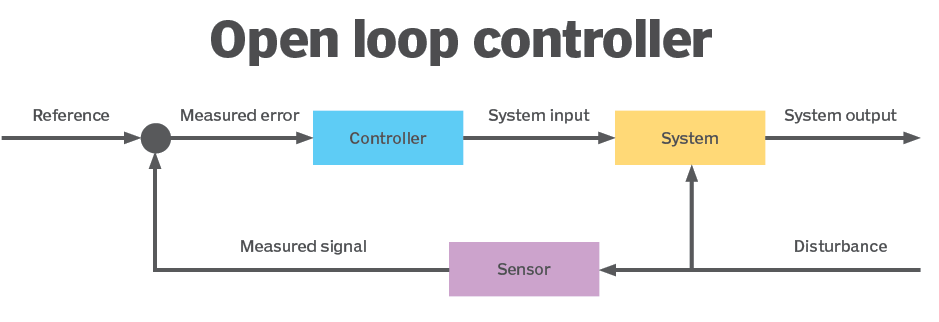

 **Closed Loop control systems/ Feedback control systems**- Applying control commands based on the measurements of the output with the help of a controller

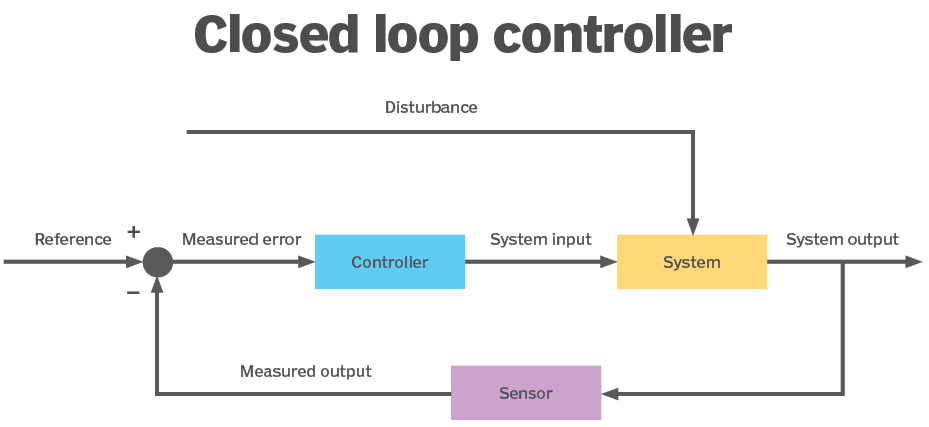





The outputs are measured by a sensor which **feeds back** this information to the controller. The error shown in the diagram below is the difference between the desired output (which is given as an instruction in the input) and the current output. The measured error is used by the controller to act in a manner that causes the error to decrease. Once the input and feedback match the error is zero.

By taking note of the speedometer and the surrounding traffic the driver can now correct his action so that the car continues to perform desirably. The exact nature of this corrective response is called the **control law** and will be a key topic of discussion in upcoming sections.


Thus, we see that closed loop control offers distinct advantages over open loop control, such as -

*	Greater resistance to noise/bias/disturbances to the system
*	Efficient energy consumption
*	Alter the dynamic properties of the overall system


2) Based on energy expenditure

- **Passive control** — It involves minimal to no energy expenditure to impose desired behaviour. <br>
  Example - streamlined shapes of vehicles


- **Active control** — It involves greater energy expenditure for desired behaviour. <br>
  Example — externally oscillating the base of an inverted pendulum to keep it stable

# Day 2
### Hola people!!  
You all definitely would have seen those fascinating two-wheeled vehicles as shown at the beginning!! Have you ever wondered how exactly the bot balances the motion without tipping over? There is a whole huge concept of CONTROL THEORY that works behind and gives a phenomenal experience.  
Get yourself geared up for an exhilarating plunge into this captivating concept right from the foundation.

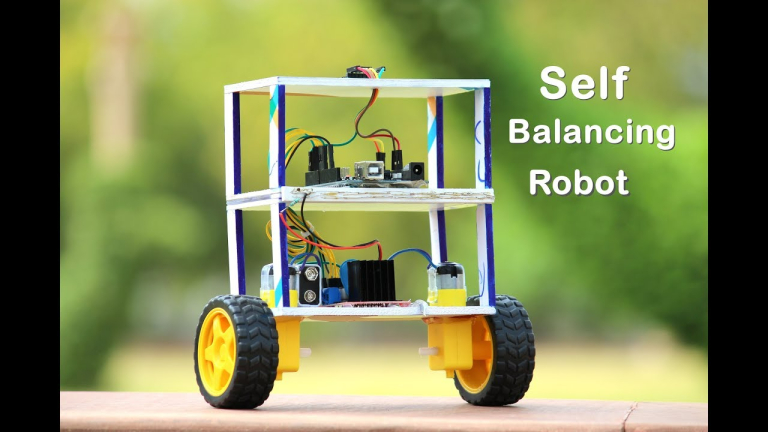

[Have a look at what we'll be working on in this bootcamp!!](https://youtu.be/aUbBUd-hBLI)

### Modeling a self-balancing bot driven by DC gear motors



### Introduction :
The two-wheeled self-balancing robot represents a robotic platform with two independently actuated wheels and a center of gravity above the axis of the wheel’s rotation. This system resembles the interesting ***inverted pendulum*** problem.  
Basically, inverted pendulum as the name suggests is a pendulum with centre of mass above the pivot point and instead of hinge point at the top in case of normal pendulum, this has a hinge point at the bottom. This is a classic example of unstable equilibrium and would fall over without control system.  






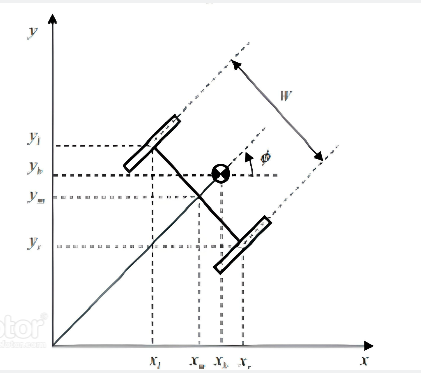

We intially define out bot's position in terms of x and y coordinate in a plane and a certian yaw angle $Ψ$. The yaw angle as seen from the figure is equal to the difference of rotation angles of both the wheels . The pose/state of the bot can be determined by left wheel's rotation angle , right wheel's rotation angle and body's tilt angle. Being able to fully control $θ$(the body tilt angle) and $Φ$(the wheel rotation angle) will allow us to attain any $x,y,Ψ$ that we want. So we'll try to get equation of motions only in terms of tilt and wheel angle.

Lets discuss different systems comprising the bot


## System Modeling

### 1. Mechanical Subsystem:


*   The systems consists of robot’s body(treated as inverted pendulum) and two wheels which are independent of each other’s motion to allow planar motion of the bot.

*  This system can be considered as an inverted pendulum with mass concentrated in the centre of gravity of the body and the axis of rotation lies above axis of the wheels.




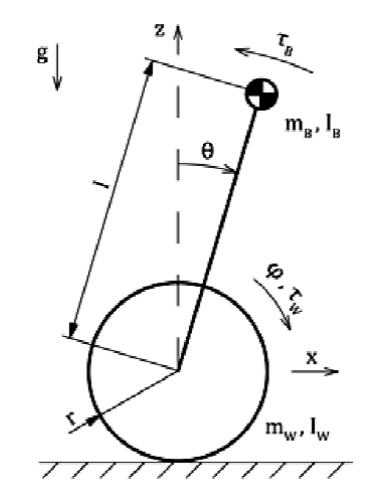

Okay so in the figure, it’s a one-sided view where the bot’s body(the inclined rod in the figure) is inclined at an angle of θ and the left wheel (circle shown) is assumed to be rotated by an angle of $Φ_L$ and the right wheel is assumed to be rotated by $Φ_R$. The yaw angle $Ψ=Φ_L - Φ_R$. The torque on left wheel is τ$_L$ and the torque on right wheel is τ$_R$ and the torque on body is τ$_b$. The mass of body and its moment of inertia is $m_b$ and  $I_b$.The mass of wheels and moment of inertia of wheels about their rotational axis is m$_w$ and $I_w$.  
 To derive motion equations, this bot is considered as a planar model and it moves along the horizontal axis. No slipping condition is assumed between the wheels and the ground.


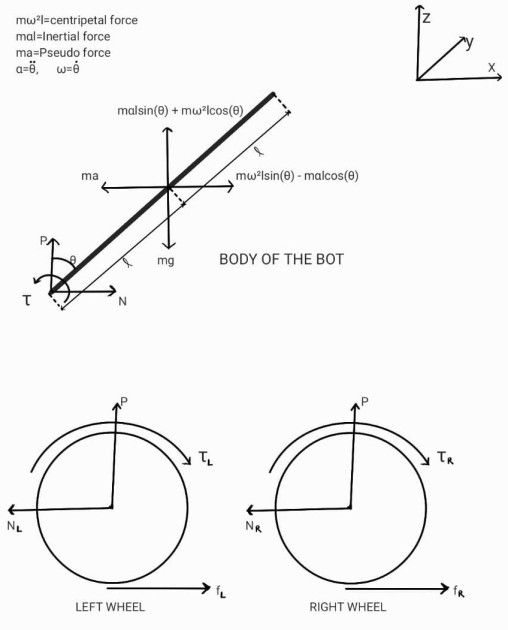

Alright, folks, it's time to buckle up and grab your trusty pen and paper because we're about to embark on an exciting journey into the world of inverted pendulum dynamics. Are you ready? Let's dive right in and derive the force balance equations for this captivating system.  
Firstly draw a separate FBD for both the wheels and the rod/body of the bot. Beware of the three accelerations on the pendulum with respect to the inertial frame. FBDs are shown in the figure to make your work easy

Let's go step wise

In the FBD of wheels we can write one equation in horizontal $+x$ direction and one torque balance equation about the centre of wheel.
There is a static frictional force acting in $+x$ direction and one normal hinge reaction acting in $-x$ direction and a clockwise torque, pure rolling motion considered for both the wheels.


1.   force balance in horizontal direction   
let the bot be moved in +x direction by a distance x   
let's work out the equations on the left wheel and similar equations would be there for the right wheel as well:  
f$_L$ = friction acting between the wheel and the ground  
N$_L$ = hinge reaction force between body and the wheel   
m$_w$ = mass of the wheels


*   $f_L - N_L = m_wẍ$
2.  Torque balance eqn about centre of mass of the wheel  
$τ_L$ = torque applied on the left wheel by the motor  
$f_L$ = friction between wheel and the ground  
$I_w$ = Moment of inertia of wheel about its axis of rotation  
$Φ_L$ = Angle rotated by the wheel in clockwise direction


*   $τ_L - f_Lr = I_w\ddotΦ_L$  

solving these two eqns and eliminating f$_L$, we get  
\begin{equation}N_L = \frac{τ_L}{r} - m_w\ddot{x} - \frac{I_w\ddotΦ_L}{r}\end{equation}  
similarly you can derive for the right wheel,  
\begin{equation}N_R = \frac{τ_R}{r} - m_w\ddot{x} - \frac{I_w\ddotΦ_R}{r}\end{equation}


Now check the FBD of the body with respect to joint frame, we consider length of pendulum as $2l$ and mass of the body as $m$, and the net torque acting on the body is $τ$ in anticlockwise direction. you can see in the figure that apart from hinge forces and gravity, there are three more forces acting at the centre of mass, these are  
1. Centripetal force along the pendulum : $m\dotθ^2l$
2. Inertial force perpendicular to the pendulum : $ml\ddotθ$  
3. Pseudo force : $m\ddot{x}$    

From the FBD, its quite evident that at the hinge point (point of interaction between body and the wheels) :  


*   $N = N_L + N_R$  
from above derived equations for $N_L$ and $N_R$ we get,  
\begin{equation}\begin{aligned}N = \frac{τ_L + τ_R}{r} - 2m_w\ddot{x} - \frac{I_w(\ddotΦ_L + \ddotΦ_R)}{r}&&\text{(1)}\end{aligned}\end{equation}

*   $τ = τ_L + τ_R$  

Now, again solving same force and torque balance equations for the body:  


1.   Force balace equation in horizontal direction :
     $N + m\dot{θ}^2lsinθ = m\ddot{x} + ml\ddot{θ}cosθ$  
     *NOTE: We assume the angle θ to be very small for simplicity so,  
     assumptions:  
     θ ≈ 0  
     sinθ = θ  
     cosθ = 1   
     $θ^2 = 0$  
     $\dot{θ}^2 = 0$  
     applying the assumptions we get,  
     \begin{equation}\begin{aligned}N = m\ddot{x} + ml\ddot{θ}&&\text{(2)}\end{aligned}\end{equation}  

*    For the first equation of the mechanical subsystem, substitute the expression for N from force balance eqns of the body (eq1 and eq2) we get,   
one change you'll have to make is that as its a pure rolling motion so we know that  
$x=rΦ$ so in equation1 convert the Φ terms into x and make the required changes according to the assumptions considered above :)  


\begin{equation}(2m_w + m + \frac{2I_w}{r^2})\ddot{x} + ml\ddot{θ} = \frac{τ_L + τ_R}{r}\end{equation}

     
2.   Torque balance equation about the hinge point:    






 *  *NOTE: In the figure above, θ is considered clockwise, that is why RHS term is negative!!   
     $τ + ( ml\ddot{θ}sinθ + m\dot{θ}^2lcosθ)lsinθ +  m\ddot{x}(lcosθ) -mglsinθ - ( m\dot{θ}^2lsinθ - ml\ddot{θ}cosθ)lcosθ = -I_b\ddot{θ}$  
     applying the same assumptions as above we get,  
     $τ + ml\ddot{x} + m\ddot{θ}l^2 - mglθ = -I_b\ddot{θ}$  
    
 so, here we get our second equation of the mechanical subsystem of the bot:  


*   \begin{equation}ml\ddot{x} + (ml^2 + I_b)\ddot{θ} -mglθ = -(τ_L + τ_R)\end{equation}

   

Sit back and relax for a bit now!! as we have got the two required equations for the mechanical subsystem of our bot!!   


1.   \begin{equation}(2m_w + m + \frac{2I_w}{r^2})\ddot{x} + ml\ddot{θ} = \frac{τ_L + τ_R}{r}\end{equation}  


2.   \begin{equation}ml\ddot{x} + (ml^2 + I_b)\ddot{θ} -mglθ = -(τ_L + τ_R)\end{equation}









     
       

















  







# Day 3
### 2. Actuator System


*  Actuator is a component responsible for physical motion of the bot.There are multiple types of motors available that can serve the purpose like DC motos and stepper motors.[Some more information about motors](https://www.elprocus.com/different-types-of-electric-motors/)  Here, the brushed DC gearmotors are used as the actuator subsystem of the robot.


*  This subsystem provides rotary motion and coupled with the wheels that causes the bot’s movement.
* The input to this subsystem is voltage source $v_s$ applied to the motor’s armature, while the output is the rotational speed $Φ_M$  and torque $τ_M$ of the  shaft.




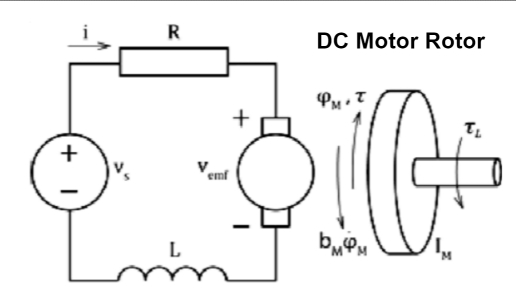


In the figure above, the b$_M$ term is due to motor viscous friction, we ignore it here for simplicity.  
τ = DC motor torque (the natural torque of DC motor).    
τ$_L$ = Output torque of the left DC motor.  
(here we are considering the motor eqns for the left wheel, same can be written for the right wheel too with τ$_R$).    
I$_M$ = Moment of inertia of the motor.  
ϕ$_M$ = angle rotated by the motor.  

*  The torque generated by DC motor is proportional to the armature current and the strength of the magnetic field. We consider magnetic field to be constant. So,   
  \begin{aligned}τ = k_ti&&\text{(1)}\end{aligned}                      
  k$_t$ is the constant of proportionality


*  As the shaft rotates in magnetic field, back emf is created, and that is proportional to angular velocity of the  shaft. So,  
   \begin{aligned}v_{emf} = k_e.\dot{Φ}_M&&\text{(2)}\end{aligned}             
  k$_e$ is the constant of proportionality & $\dot{Φ}$ is the angular velocity of the shaft  (“back emf is generated as a result of faradays law of electromagnetic induction due to changing magnetic field, voltage is induced in the conductor.”)[link for faradays laws in detail](https://www.electricalvolt.com/2022/07/faraday-law-of-electromagnetic-induction/)

  #NOTE : The motor torque and back emf **constant** have the same numerical value in SI units, therefore we will use $K$ to represent them both.  
  $k_t=k_e=K$



*  Applying KVL on the circuit given above,  we get:  
   \begin{aligned}v_s - i.R - L\frac{di}{dt} - v_{emf} = 0&&\text{(3)}\end{aligned}    
   #NOTE : Given that the value of inductance L of a small DC motor is in general a very low number compared
to its resistance R, we can neglect it

*   From the given figure,  
    \begin{aligned}τ = τ_L + I_M\ddot{Φ}_M&&\text{(4)}\end{aligned}    

    solving eqns 1,2,3,4 we get, **The overall DC motor characteristics** :

    **\begin{equation}I_M\ddot{Φ}_M+ \frac{K^2\dot{Φ}_M}{R} + τ_L = \frac{K.v_s}{R}\end{equation}**  
    This is a generic $Φ_M$ written which denotes the angle rotated by wheel with respect to the motor body.  
    if we consider $Φ_L$ and $Φ_R$ to be the angle rotated by left and right wheel respectively with respect to ground, then from figure from mechanical subsystem, we know,  
    $Φ_L = (Φ_M)_L + θ$  
    $Φ_R = (Φ_M)_R + θ$    
    Hence, the final actuator subsystem equations for the left and the right wheel are:  
       

*   **\begin{equation}I_M(\ddot{Φ}_L-\ddot{θ})+ \frac{K^2(\dot{Φ}_L-\dot{θ})}{R} + τ_L = \frac{K.(v_s)_L}{R}\end{equation}**
*    **\begin{equation}I_M(\ddot{Φ}_R-\ddot{θ})+ \frac{K^2(\dot{Φ}_R-\dot{θ})}{R} + τ_R = \frac{K.(v_s)_R}{R}\end{equation}**








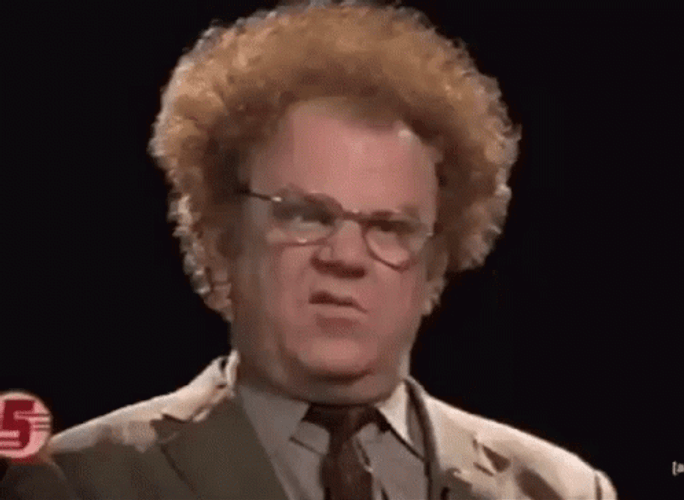

In [ ]:
#@title You might be like this right now!! but trust me go ahead:)
from IPython.display import Image

Image(filename='/content/confused-meme-498-x-364-gif-bn81c5sno2fhv462.gif', width=400, height=400)




# Day 4
### 3. Overall model of the bot

So now that we have worked on and got the equations for the mechanical subsystem and the actuator system, we can combine these equations to get equations in terms of six state variables of the bot.  

Combining DC motor characteristic equation and the mechanical subsystem equations, we get a relation between all the six state variables of the system(θ , $\dot{θ}$ , Φ$_L$ , Φ$_R$ , $\dot{ϕ}$$_L$ , $\dot{ϕ}$$_R$)  

We use the following eqns which we have derived earlier:  


*  \begin{equation}(2m_w + m + \frac{2I_w}{r^2})\ddot{x} + ml\ddot{θ} = \frac{τ_L + τ_R}{r}\end{equation}  
now it was already stated earlier that motion of wheels is pure rolling, no slipping so,  
$x=rΦ$  
in our case,  
$x = \frac{r.(Φ_L + Φ_R)}{2}$  
hence double differenciating the terms we get,  
$\ddot{x} = \frac{r.(\ddotΦ_L + \ddotΦ_R)}{2}$

 now substitue this in the eqn above  
      
\begin{equation}\begin{aligned}(2m_w + m + \frac{2I_w}{r^2})\frac{r.(\ddotΦ_L + \ddotΦ_R)}{2} + ml\ddot{θ} = \frac{τ_L + τ_R}{r}&&\text{(1)}\end{aligned}\end{equation}

From the actuator subsystem, we got these two equations before:
*   $I_M(\ddot{Φ}_L-\ddot{θ})+ \frac{K^2(\dot{Φ}_L-\dot{θ})}{R} + τ_L = \frac{K.(v_s)_L}{R}⟶(2)$


*    $I_M(\ddot{Φ}_R-\ddot{θ})+ \frac{K^2(\dot{Φ}_R-\dot{θ})}{R} + τ_R = \frac{K.(v_s)_R}{R}⟶(3)$   


#### Adding eq 2 and 3 we get,  

\begin{equation}τ_L + τ_R = \frac{K((v_s)_L + (v_s)_R)}{R} - I_M(\ddot{Φ}_L + \ddot{Φ}_R - 2\ddotθ) - \frac{K^2(\dot{Φ}_L + \dot{Φ}_R - 2\dot{θ})}{R}\end{equation}   




 Substitute the above expression  in equation 1 to get the first final equation in terms of all state variables:    



  \begin{equation}(\ddot{Φ}_L + \ddot{Φ}_R)(r^2(m_w + \frac{m}{2} + \frac{I_w}{r^2}) + I_M) + (mlr-2I_M)\ddot{θ}  +  \frac{K^2(\dot{Φ}_L + \dot{Φ}_R - 2\dot{θ})}{R} = \frac{K((v_s)_L + (v_s)_R)}{R}\end{equation}  



  Don't worry let's make this simple!!  
   $A\ddot{ϕ}_L + B\ddot{ϕ}_R + C\ddot{θ} + D\dot{ϕ}_L + E\dot{ϕ}_R + F\dot{θ} = X((v_s)_L + (v_s)_R)$  
   So,  
   $A=r^2(m_w + \frac{m}{2} + \frac{I_w}{r^2}) + I_M$  
   $B=r^2(m_w + \frac{m}{2} + \frac{I_w}{r^2}) + I_M$  
   $C=mlr - 2I_M$  
   $D=\frac{K^2}{R}$  
   $E=\frac{K^2}{R}$  
   $F=-2\frac{K^2}{R}$  
   $X=\frac{K}{R}$





    
  For the second final equation we use other equation that we got from mechanical subsystem:  

   \begin{equation}ml\ddot{x} + (ml^2 + I_b)\ddot{θ} -mglθ = -(τ_L + τ_R)\end{equation}    
  Substitute the above expression of $τ_L + τ_R$ in this eqn to get the second final eqn in terms of all state variables:  
  
  \begin{equation}(\ddot{Φ}_L + \ddot{Φ}_R)(\frac{ml}{2} - I_M) - \frac{K^2(\dot{Φ}_L + \dot{Φ}_R - 2\dot{θ})}{R} + (ml^2 + I_b + 2I_M)\ddot{θ} - mglθ = -\frac{K((v_s)_L + (v_s)_R)}{R}\end{equation}   

  Don't worry let's make this simple again!!   
  $P\ddot{ϕ}_L + Q\ddot{ϕ}_R + R\ddot{θ} + S\dot{ϕ}_L + T\dot{ϕ}_R + Uθ + W\dot{θ}= -X((v_s)_L + (v_s)_R)$  
  So,  
  $P=\frac{ml}{2} - I_M$  
  $Q=\frac{ml}{2} - I_M$  
  $R=ml^2 + I_b +2I_M$  
  $S=-\frac{K^2}{R}$  
  $T=-\frac{K^2}{R}$  
  $U=-mgl$   
  $W=2\frac{K^2}{R}$   
  $X=\frac{K}{R}$


So finally after a lot of efforts we have got our final two simplified equations in terms of state variables, and we can write these two equations in matrix form as follows:

*   $A\ddot{ϕ}_L + B\ddot{ϕ}_R + C\ddot{θ} + D\dot{ϕ}_L + E\dot{ϕ}_R + F\dot{θ} = X((v_s)_L + (v_s)_R)$  

*   $P\ddot{ϕ}_L + Q\ddot{ϕ}_R + R\ddot{θ} + S\dot{ϕ}_L + T\dot{ϕ}_R + Uθ +W\dot{θ} = -X((v_s)_L + (v_s)_R)$  

#### Matrix form of the above equations:  
E$\begin{bmatrix}\ddot{Φ}_L \\ \ddot{Φ}_R \\ \ddot{θ}\end{bmatrix}$ + F$\begin{bmatrix}\dot{Φ}_L \\ \dot{Φ}_R \\ \dot{θ}\end{bmatrix}$ + G$\begin{bmatrix}Φ_L \\ Φ_R \\ θ\end{bmatrix}$ = H$\begin{bmatrix}(v_s)_L
 \\ (v_s)_R\end{bmatrix}$  

 now you might be wondering how these matrices came into picture, so basically  let's recall our main goal for all this tedious mathematics, we were supposed to control the horizontal motion of our bot taking care that it doesn't tip over so our these calculations are required to control the bot using the feedback mechanism that would be covered in much more detail in upcoming weeks!!  
 If you curious enough, you can try getting matrices E,F,G,H for instance  
 $E =\begin{bmatrix}A & B & C \\ P & Q & R \end{bmatrix}$     


 The input of the system is voltage $v_s$ applied to the motor’s armature and
the outputs of the system are the tilt angle θ of the robot’s body and the distance $x=rΦ$ with which robot
moves horizontally anf the yaw of the bot give by $\Psi$.  

Finally, the state space model of self-balancing two-wheeled robot is given as:  
$\begin{bmatrix}\dot{Φ}_L \\ \dot{Φ}_R  \\ \dot{θ} \\ \ddot{Φ}_L \\ \ddot{Φ}_R \\ \ddot{θ}\end{bmatrix}$ = $\begin{bmatrix}\begin{matrix}0 & 0 & 0 \\0 & 0 & 0 \\0 & 0 & 0\end{matrix}  &  \begin{matrix}1 & 0 & 0 \\ 0 & 1 & 0 \\ 0 & 0 & 1 \end{matrix} \\ \hline \\ \begin{matrix}-E^{-1}G\end{matrix} & \begin{matrix}-E^{-1}F\end{matrix}\end{bmatrix}$$\begin{bmatrix}{Φ}_L \\ {Φ}_R  \\ {θ} \\ \dot{Φ}_L \\ \dot{Φ}_R \\ \dot{θ}\end{bmatrix}$ + $\begin{bmatrix}\begin{matrix}0 & 0 \\ 0 & 0\end{matrix}\\ \hline \begin{matrix}E^{-1}H\end{matrix}\end{bmatrix}$ $\begin{bmatrix}(v_s)_L \\ (v_s)_R\end{bmatrix}$  

This is a classic matrix form equation which will be used in upcoming weeks in much more detail to examine the PID control systems and the feedback mechanisms!!  

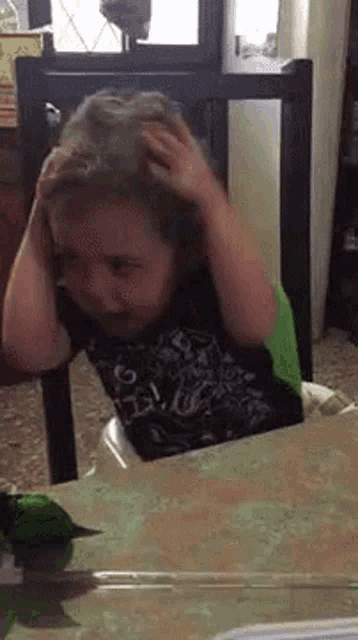

In [ ]:
#@title yeah after what you have seen so far, you might feel like him!! But have patience and continue till the end
from IPython.display import Image

Image(filename='/content/desperate-going.gif', width=400, height=400)




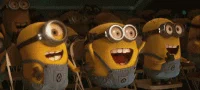

In [ ]:
#@title At the end You may end up like these:)

from IPython.display import Image

Image(filename='/content/happy.gif', width=400, height=400)




# Day 5
### 4. State Space Model  

*   State of System : The set of variables that provides the future state and the output of the system for a given input.
 Now in our case,  
 State variables = {$Φ_L , Φ_R , θ$}  
 These three parameters will give us information about the state of the system at any point of time.  
 We denote $x$ as the state, u as the input and y as the output.  
 The above derived matrix form equation can be written as:  
 $\dot{x} = Ax + Bu$  
 where $x$ denotes the state of the system, here  
 $x = \begin{bmatrix}{Φ}_L \\ {Φ}_R  \\ {θ} \\ \dot{Φ}_L \\ \dot{Φ}_R \\ \dot{θ}\end{bmatrix}$   
 $u$ is the input to the system, here  
 $u=\begin{bmatrix}(v_s)_L \\ (v_s)_R\end{bmatrix}$  

 $A$ and $B$ are the corresponding matrices as can be seen from the complete matrix form equation as derived earlier.  

 The output of the system would be the yaw angle $Ψ=Φ_L - Φ_R$, distance  $x=\frac{r(Φ_L + Φ_R)}{2}$ covered by the bot and tilt angle $θ$.  
 We denote output by y, here   
 $y=\begin{bmatrix}x & θ & Ψ\end{bmatrix}$   
 $y=\begin{bmatrix}\frac{r}{2} & \frac{r}{2} & 0 & 0 & 0 & 0 \\
 0 & 0 & 1 & 0 & 0 & 0 \\
 1 & -1 & 0 & 0 & 0 & 0\end{bmatrix}$$\begin{bmatrix}{Φ}_L \\ {Φ}_R  \\ {θ} \\ \dot{Φ}_L \\ \dot{Φ}_R \\ \dot{θ}\end{bmatrix}$

The output can also be writeen as:  
$y=Cx+Du$

Now we have two state-space equations:  


*   $\dot{x} = Ax + Bu$
*   $y=Cx+Du$  

The goal is to keep a pendulum vertically while controlling the robot’s movement. This problem can
be solved using a state feedback controller. The schematic of this type of control is shown in Figure below.










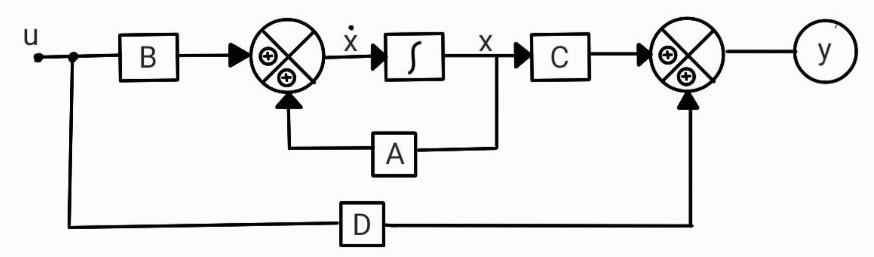

In the upcoming weeks, you'll get a better understanding of the state-space feedback controller and how exactly it helps in actuating the hinge point between body and the wheels under PID controllers!  
Happy learning!!

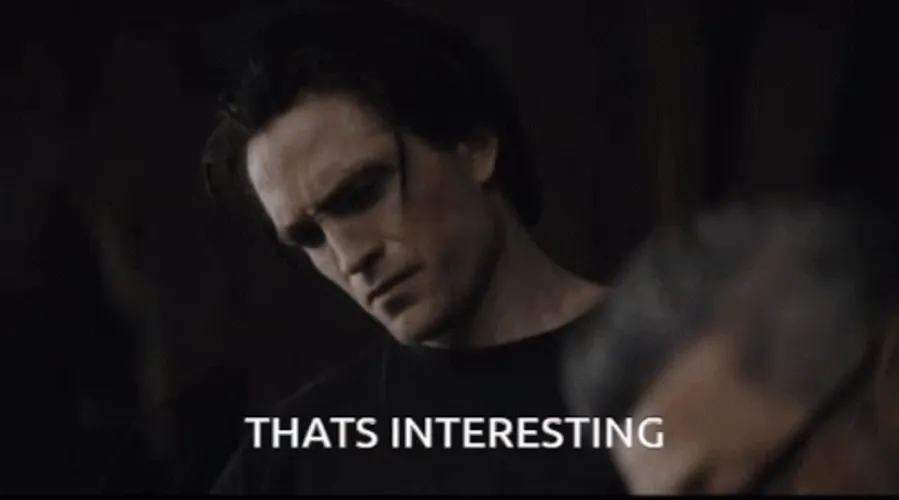

In [ ]:
#@title We have a lot more for you!! Stay tuned:)

from IPython.display import Image

Image(filename='/content/interesting-gif-file-3189kb-bfws21b4y5s302jm.gif', width=400, height=400)


